### This script contains the following points:

#### 1. Importing libraries
#### 2. Importing and formatting clean dataframe
#### 3. Creating a subset to explore variable relationships
#### 4. Correlation matrix heatmap
#### 5. Scatterplot for variables with strongest correlations.
#### 6. Pair plot using columns with numerical data.
#### 7. Categorical plots
#### 8. Further questions
#### 9. Hypotheses
#### 10. Exporting data and visuals

# 1. Importing libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
# This option ensures the charts are displayed in the notebook without the need to "call" them specifically.

%matplotlib inline

# 2. Importing and formatting clean data

In [4]:
# importing clean dataframe

df_clean = pd.read_csv(r'C:\Users\kevan\Documents\Career Foundry\Data Immersion\Achievement 6\Final Project\Data\Prepared Data\df_clean.csv', index_col = 0)

In [5]:
# assigning main project path to variable 'path'

path = r'C:\Users\kevan\Documents\Career Foundry\Data Immersion\Achievement 6\Final Project'

In [6]:
path

'C:\\Users\\kevan\\Documents\\Career Foundry\\Data Immersion\\Achievement 6\\Final Project'

In [7]:
# open the os library, find function that joins paths

df_clean = pd.read_csv(os.path.join(path, 'Data', 'Prepared Data', 'df_clean.csv'), index_col = 0)

In [8]:
# setting max columns to see all in df

pd.set_option('display.max_columns', 50)

In [9]:
# setting max rows to see all in df

pd.set_option('display.max_rows', 160)

# 3. Creating a subset to explore variable relationships

In [10]:
# making column names shorter

df_clean.rename(columns= {'Simple_Reporting_Option':'Simple_Reporting','bbce':'BBCE', '%dollar_EBT':'EBT Issuance', 'Int_Face_Interview_Waiver':'Initial Phone Interview', 'Recert_Face_Interview_Waiver':'Recertification Phone Interview', 'State_Name':'State', 'bbce_inclmt_%':'Income_Limit', '1to3mo_recert_%SNAP':'1to3_earn', '4to6mo_recert_%SNAP':'4to6_earn', '7to12mo_recert_%SNAP':'7to12_earn', '13mo_plus_recert_%SNAP':'13mo_earn', '%elderly_1to3mo_recert':'1to3_elderly', '%elderly_4to6mo_recert':'4to6_elderly', '%elderly_7to12mo_recert':'7to12_elderly', '%elderly_13moplus_recert':'13mo_elderly', '%nonearn_1to3mo_recert':'1to3_nonearn','%nonearn_4to6mo_recert':'4to6_nonearn','%nonearn_7to12mo_recert':'7to12_nonearn','%nonearn_13moplus_recert':'13mo_nonearn','Outreach_Spending_1kdollars':'outreach_spend'}, inplace = True)

In [11]:
df_clean.shape

(12852, 49)

In [12]:
df_clean.describe()

,Year,Month,Income_Limit,bbce_assetlmt_eliminated,bbce_assetlmt_1kdollars,bbce_vehicle,bbce_household,bbce_senior_disabled,call_center,CAP_for_SSI,1to3_earn,4to6_earn,7to12_earn,13mo_earn,Average_Months_Certification,Median_Months_Certification,1to3_elderly,4to6_elderly,7to12_elderly,13mo_elderly,Average_Months_Elderly,Median_Months_Elderly,1to3_nonearn,4to6_nonearn,7to12_nonearn,13mo_nonearn,Average_Months_Nonearning,Median_Months_Nonearning,EBT Issuance,Initial Phone Interview,Recertification Phone Interview,fingerprint,All_Elig_Noncitizen_Adult,Some_Elig_Noncitizen_Adult,All_Elig_Noncitizen_Child,Some_Elig_Noncitizen_Child,All_Elig_Noncitizen_Elderly,Some_Elig_Noncitizen_Elderly,Online_Application,outreach_spend,Simple_Reporting,Transitional_Benefits,Exclude_All_Vehicles,High_Vehicle_Exemption,Exclude_OnePlus_Vehicles
count,12852.000000,12852.000000,12852.000000,12852.000000,12852.000000,12852.000000,12852.000000,12852.000000,12750.000000,12750.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12699.000000,12852.000000,12852.000000,12852.000000,12852.000000,12648.000000,12648.000000,12852.000000,12852.000000,12648.000000,12648.000000,12852.000000,12699.000000,12750.000000,12750.000000,12138.000000,12138.000000,12138.000000
mean,2006.000000,6.500000,56.891846,-5.411376,-8.393285,-8.651416,-5.689153,-5.648693,0.485098,0.183137,0.105132,0.389936,0.484612,0.020320,8.634897,8.444090,0.008189,0.070416,0.604916,0.316480,15.631003,15.777338,0.065632,0.311354,0.519991,0.103023,10.544474,9.306671,0.849717,0.325630,0.401650,0.088080,0.152514,0.783365,0.728758,0.210084,0.175206,0.762650,0.351618,46.246503,0.622353,0.232471,0.490690,0.067968,0.150437
std,6.055536,3.452187,89.200936,4.763230,3.405424,1.813161,4.397893,4.452648,0.709552,0.386794,0.222019,0.386739,0.409296,0.048566,3.059978,3.366572,0.020248,0.099161,0.324250,0.331520,5.205364,5.873939,0.113765,0.279109,0.293496,0.120672,2.921834,2.931076,0.344328,0.468628,0.490251,0.344176,0.359533,0.411968,0.444618,0.407384,0.380158,0.425475,0.520084,130.407538,0.484818,0.422424,0.499934,0.251702,0.357514
min,1996.000000,1.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.055556,2.833333,0.000000,0.000000,0.000000,0.000000,7.253339,6.000000,0.000000,0.000000,0.000000,0.000000,4.534513,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2001.000000,3.750000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,0.000000,0.000000,0.000000,0.022544,0.060169,0.000000,6.076065,6.000000,0.000000,0.000000,0.286677,0.011111,11.659832,12.000000,0.002658,0.036973,0.269102,0.005556,7.810401,6.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2006.000000,6.500000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,0.000000,0.000000,0.007410,0.222421,0.399155,0.006265,7.755426,6.750000,0.000000,0.037739,0.696514,0.177193,13.333333,12.000000,0.014603,0.237982,0.498028,0.047917,10.694398,11.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.286417,1.000000,0.000000,0.000000,0.000000,0.000000
75%,2011.000000,9.250000,160.000000,1.000000,-9.000000,-9.000000,0.000000,0.000000,1.000000,0.000000,0.041667,0.816041,0.940116,0.020512,11.838458,12.000000,0.009365,0.100000,0.898148,0.655491,19.886151,22.000000,0.060633,0.567186,0.791543,0.177484,12.547250,12.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,32.973831,1.000000,0.000000,1.000000,0.000000,0.000000
max,2016.000000,12.000000,200.000000,1.000000,25.000000,1.

In [13]:
# interested in detecting relationships between policy variables
# dropping columns that won't be used in correlation heat map

df_heatmap = df_clean.drop(columns=['All_Elig_Noncitizen_Child', 'Recertification Phone Interview', 'EBT Issuance', 'Median_Months_Nonearning', 'Average_Months_Nonearning', '13mo_nonearn', '7to12_nonearn', 'Median_Months_Elderly', 'Average_Months_Elderly', '13mo_elderly', '7to12_elderly', 'Median_Months_Certification', 'Average_Months_Certification', '13mo_earn', '7to12_earn', 'bbce_senior_disabled', 'bbce_household', 'bbce_vehicle', 'bbce_assetlmt_1kdollars', 'bbce_assetlmt_eliminated', 'Year', 'call_center', 'CAP_for_SSI', 'fingerprint', 'All_Elig_Noncitizen_Adult', 'Some_Elig_Noncitizen_Adult', 'Some_Elig_Noncitizen_Child', 'All_Elig_Noncitizen_Elderly', 'Some_Elig_Noncitizen_Elderly', 'Transitional_Benefits', 'High_Vehicle_Exemption', 'Exclude_OnePlus_Vehicles', 'outreach_spend', '1to3_earn', '4to6_earn', '1to3_elderly', '4to6_elderly', '1to3_nonearn', '4to6_nonearn', 'Month', 'Income_Limit', 'State', 'EBT category', 'Fingerprint requirement'])
df_heatmap

,BBCE,Initial Phone Interview,Online_Application,Simple_Reporting,Exclude_All_Vehicles
0,False,0,0,0.0,0.0
1,False,0,0,0.0,0.0
2,False,0,0,0.0,0.0
3,False,0,0,0.0,0.0
4,False,0,0,0.0,0.0
...,...,...,...,...,...
12847,False,1,0,1.0,NaN
12848,False,1,0,1.0,NaN
12849,False,1,0,1.0,NaN
12850,False,1,0,NaN,NaN


In [14]:
# checking shape of dataframe

df_heatmap.shape

(12852, 5)

In [15]:
# detecting rows with missing values 

df_heatmap.isnull().sum()

BBCE                         0
Initial Phone Interview      0
Online_Application           0
Simple_Reporting           102
Exclude_All_Vehicles       714
dtype: int64

In [16]:
# dropping null values

df_heatmap = df_heatmap.dropna()

In [17]:
# rows with null values dropped

df_heatmap.isnull().sum()

BBCE                       0
Initial Phone Interview    0
Online_Application         0
Simple_Reporting           0
Exclude_All_Vehicles       0
dtype: int64

In [18]:
# no mixed data types found

for col in df_heatmap.columns.tolist():
      weird = (df_heatmap[[col]].map(type) != df_heatmap[[col]].iloc[0].apply(type)).any(axis = 1)
      if len (df_heatmap[weird]) > 0:
        print (col)

In [19]:
# checking data types

df_heatmap.dtypes

BBCE                          bool
Initial Phone Interview      int64
Online_Application           int64
Simple_Reporting           float64
Exclude_All_Vehicles       float64
dtype: object

# 4. Correlation matrix heatmap

In [20]:
# creating correlation matrix for policy variables

df_heatmap.corr()

,BBCE,Initial Phone Interview,Online_Application,Simple_Reporting,Exclude_All_Vehicles
BBCE,1.000000,0.532292,0.416850,0.467123,0.586911
Initial Phone Interview,0.532292,1.000000,0.588437,0.491347,0.437506
Online_Application,0.416850,0.588437,1.000000,0.456207,0.406748
Simple_Reporting,0.467123,0.491347,0.456207,1.000000,0.609201
Exclude_All_Vehicles,0.586911,0.437506,0.406748,0.609201,1.000000


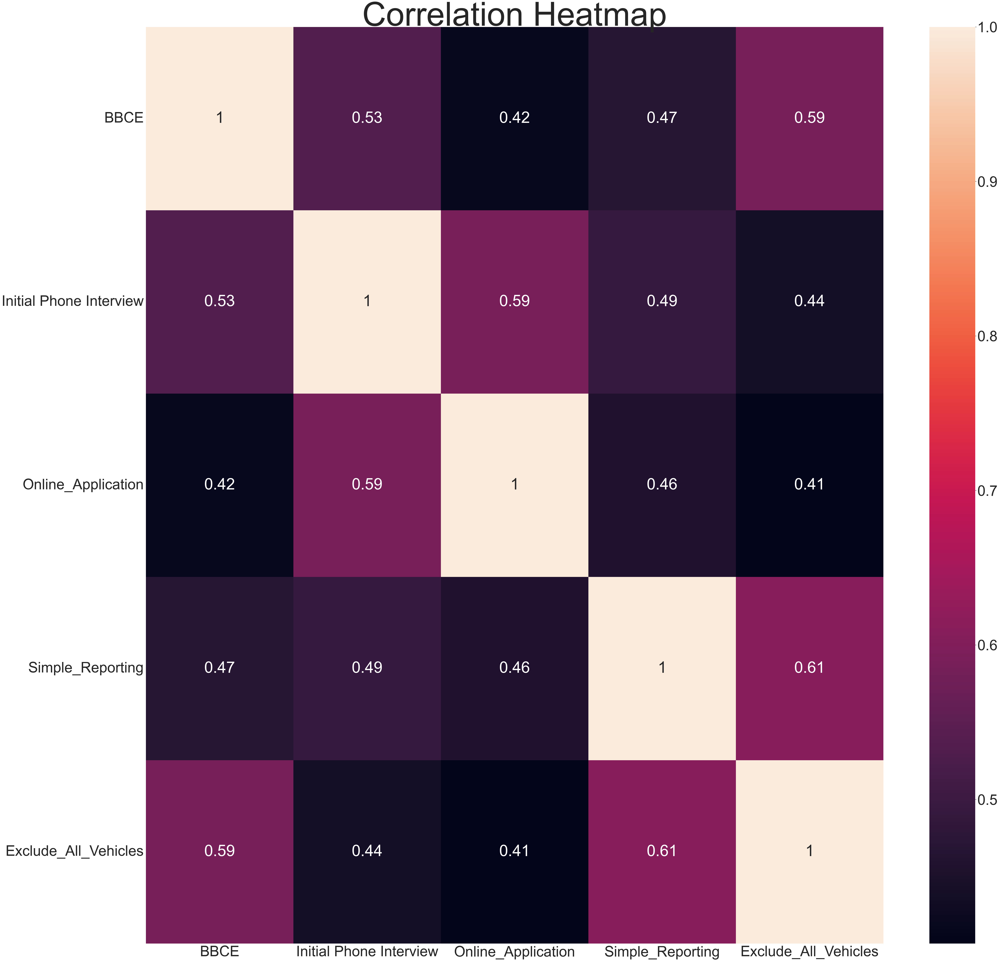

In [21]:
# correlation heatmap with seaborn
# `annot` argument allows the plot to place the correlation coefficients onto the heatmap.

sns.set(font_scale=6.0)
yticks=df_heatmap.corr().index
xticks=df_heatmap.corr().index
f,ax = plt.subplots(figsize=(75,75))
corr_heatmap = sns.heatmap(df_heatmap.corr(), annot = True, ax=ax)
plt.yticks(rotation=0)
plt.xticks(rotation=0) 
plt.title('Correlation Heatmap', fontsize=150) # add title
plt.show()

### These policies chosen because a significant correlation (>0.50) was detected. These policies will be used in analysis.

# 5. Scatterplot for variables with strongest correlations.

In [22]:
# detecting rows with missing values 

df_clean.isnull().sum()

State                                0
Year                                 0
Month                                0
BBCE                                 0
Income_Limit                         0
bbce_assetlmt_eliminated             0
bbce_assetlmt_1kdollars              0
bbce_vehicle                         0
bbce_household                       0
bbce_senior_disabled                 0
call_center                        102
CAP_for_SSI                        102
1to3_earn                          153
4to6_earn                          153
7to12_earn                         153
13mo_earn                          153
Average_Months_Certification       153
Median_Months_Certification        153
1to3_elderly                       153
4to6_elderly                       153
7to12_elderly                      153
13mo_elderly                       153
Average_Months_Elderly             153
Median_Months_Elderly              153
1to3_nonearn                       153
4to6_nonearn             

In [23]:
# dropping null values

df_scatter = df_clean.dropna()

In [24]:
# verify that null values are dropped

df_scatter.isnull().sum()

State                              0
Year                               0
Month                              0
BBCE                               0
Income_Limit                       0
bbce_assetlmt_eliminated           0
bbce_assetlmt_1kdollars            0
bbce_vehicle                       0
bbce_household                     0
bbce_senior_disabled               0
call_center                        0
CAP_for_SSI                        0
1to3_earn                          0
4to6_earn                          0
7to12_earn                         0
13mo_earn                          0
Average_Months_Certification       0
Median_Months_Certification        0
1to3_elderly                       0
4to6_elderly                       0
7to12_elderly                      0
13mo_elderly                       0
Average_Months_Elderly             0
Median_Months_Elderly              0
1to3_nonearn                       0
4to6_nonearn                       0
7to12_nonearn                      0
1

In [25]:
# no mixed data types found

for col in df_scatter.columns.tolist():
      weird = (df_scatter[[col]].map(type) != df_scatter[[col]].iloc[0].apply(type)).any(axis = 1)
      if len (df_scatter[weird]) > 0:
        print (col)

In [26]:
# checking data types to find appropriate variables to use in scatterplot

df_scatter.dtypes

State                               object
Year                                 int64
Month                                int64
BBCE                                  bool
Income_Limit                         int64
bbce_assetlmt_eliminated             int64
bbce_assetlmt_1kdollars            float64
bbce_vehicle                         int64
bbce_household                       int64
bbce_senior_disabled                 int64
call_center                        float64
CAP_for_SSI                        float64
1to3_earn                          float64
4to6_earn                          float64
7to12_earn                         float64
13mo_earn                          float64
Average_Months_Certification       float64
Median_Months_Certification        float64
1to3_elderly                       float64
4to6_elderly                       float64
7to12_elderly                      float64
13mo_elderly                       float64
Average_Months_Elderly             float64
Median_Mont

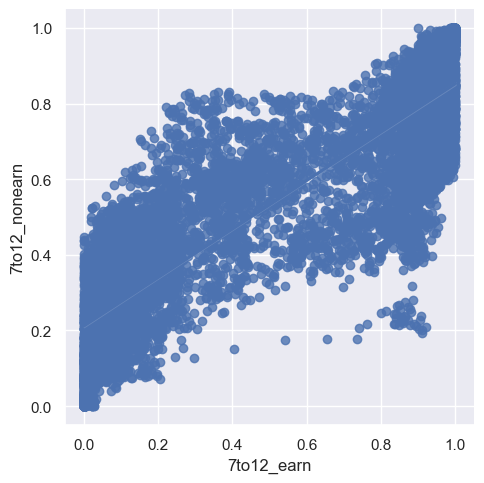

In [27]:
# Create a scatterplot for the proportion of earning and non earning individuals with 7 to 12 month recertification periods

sns.set(font_scale=1.0)
scatter_1 = sns.lmplot(x = '7to12_earn', y = '7to12_nonearn', data = df_scatter)

### As the proportion of earning individuals with 7 to 12 month recertification periods increases, so does the proportion of nonearning indviduals with 7 to 12 month recertification periods.

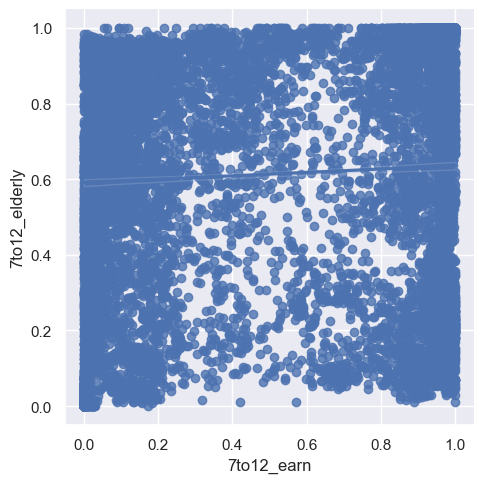

In [84]:
# Create a scatterplot for the proportion of earning and elderly with 7 to 12 month recertification periods

sns.set(font_scale=1.0)
scatter_2 = sns.lmplot(x = '7to12_earn', y = '7to12_elderly', data = df_scatter)

### No relationship detected between earning and elderly.

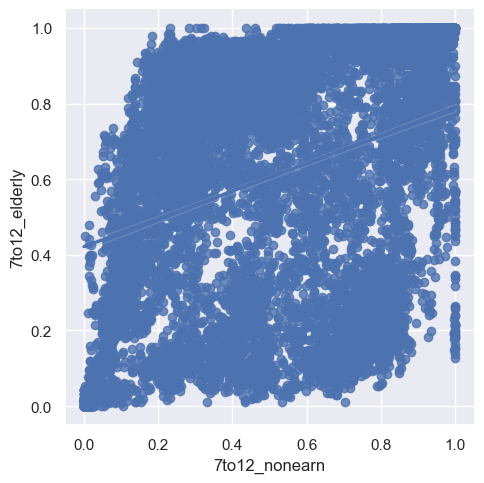

In [85]:
# Create a scatterplot for the proportion of nonearning and elderly with 7 to 12 month recertification periods

sns.set(font_scale=1.0)
scatter_3 = sns.lmplot(x = '7to12_nonearn', y = '7to12_elderly', data = df_scatter)

### No relationship detected between nonearning and elderly.

# 6. Pair plot of data set using columns with numerical data.

In [90]:
# removing non numerical columns before creating pair plot. 

df_pairplot = df_clean.drop(columns=['Exclude_All_Vehicles', 'Simple_Reporting', 'Online_Application', 'Initial Phone Interview', 'BBCE', 'Year', 'Month', 'All_Elig_Noncitizen_Child', 'Recertification Phone Interview', 'bbce_senior_disabled', 'bbce_household', 'bbce_vehicle', 'bbce_assetlmt_1kdollars', 'bbce_assetlmt_eliminated', 'call_center', 'CAP_for_SSI', 'fingerprint', 'All_Elig_Noncitizen_Adult', 'Some_Elig_Noncitizen_Adult', 'Some_Elig_Noncitizen_Child', 'All_Elig_Noncitizen_Elderly', 'Some_Elig_Noncitizen_Elderly', 'Transitional_Benefits', 'High_Vehicle_Exemption', 'Exclude_OnePlus_Vehicles', 'Income_Limit', 'State', 'EBT category', 'Fingerprint requirement'])

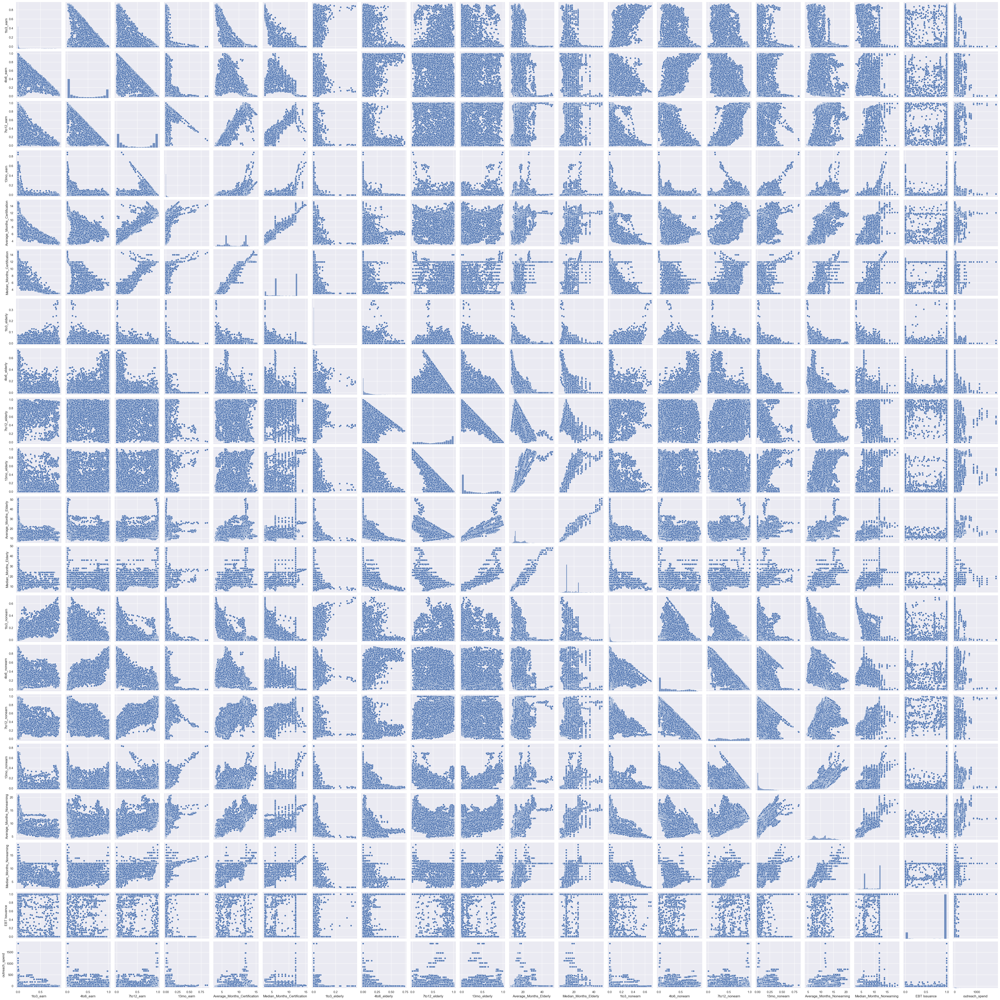

In [91]:
# pair plot using df_pairplot subset representing only numerical columns.

pairplot = sns.pairplot(df_pairplot)

# 7. Categorical plots

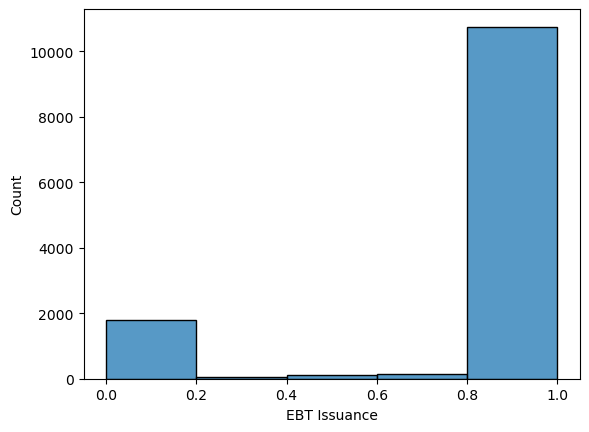

In [16]:
# create a histogram showing distribution of percentage of dollars issued with EBT

sns.histplot(df_clean['EBT Issuance'], bins = 5)
plt.show()

In [17]:
# creating categories based on percent ranges

df_clean.loc[df_clean['EBT Issuance'] < 0.4, 'EBT category'] = 'Low EBT %'

In [18]:
df_clean.loc[(df_clean['EBT Issuance'] >= 0.4) & (df_clean['EBT Issuance'] < 0.8), 'EBT category'] = 'Middle EBT %'

In [19]:
df_clean.loc[df_clean['EBT Issuance'] >= 0.8, 'EBT category'] = 'High EBT %'

In [20]:
# checking the value counts to verify that categories were created successfully

df_clean['EBT category'].value_counts(dropna = False)

EBT category
High EBT %      10746
Low EBT %        1857
Middle EBT %      249
Name: count, dtype: int64

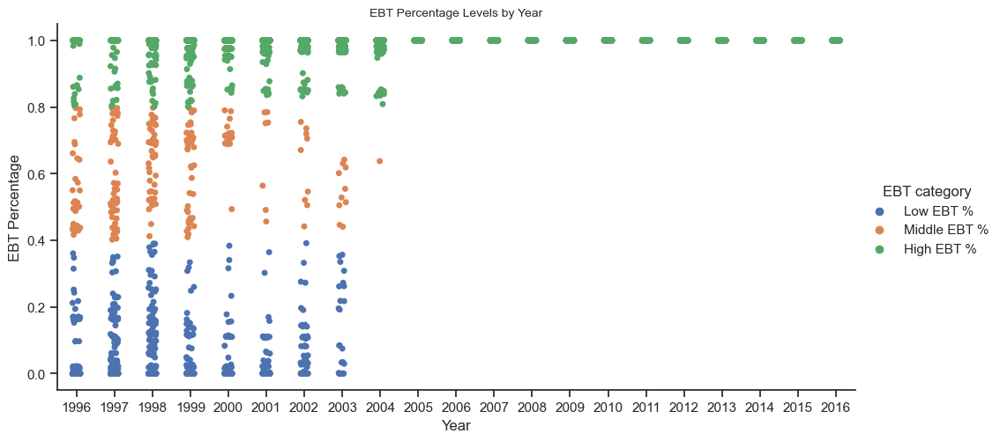

In [50]:
# Categorical plot showing different percentages of dollars issued as EBT. 

sns.set_theme(style="ticks")
EBT_catplot = sns.catplot(x="Year", y="EBT Issuance", hue="EBT category", data=df_clean, aspect =2)
plt.title('EBT Percentage Levels by Year', fontsize=10)
plt.ylabel('EBT Percentage')
plt.show()

### Beginning in most of 2004 and onward, at least 80% of SNAP benefits were accounted for by EBT in all states.

In [31]:
# flagging fingerprint requirement values

df_clean.loc[df_clean['fingerprint'] == 1, 'Fingerprint requirement'] = 'Required'

In [32]:
df_clean.loc[df_clean['fingerprint'] == 0, 'Fingerprint requirement'] = 'Not Required'

In [33]:
df_clean.loc[df_clean['fingerprint'] == 2, 'Fingerprint requirement'] = 'Required in parts of state'

In [34]:
# verify that all values accounted for

df_clean['Fingerprint requirement'].value_counts(dropna = False)

Fingerprint requirement
Not Required                  11965
Required                        642
Required in parts of state      245
Name: count, dtype: int64

In [35]:
# subset of fingerprint data

df_fingerprint = df_clean[['State', 'fingerprint', 'Fingerprint requirement']]

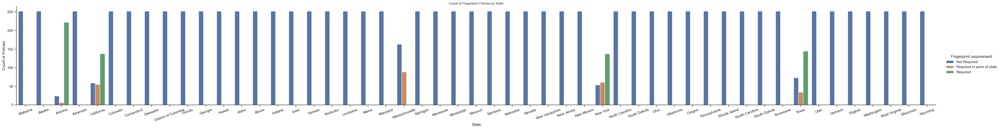

In [51]:
# Categorical bar plot showing reports of finger print requirements for each state

sns.set_theme(style="ticks")
bar_fp = sns.catplot(x="State", data=df_fingerprint, kind = 'count', hue = 'Fingerprint requirement', aspect =8)
plt.title('Count of Fingerprint Policies by State', fontsize=10)
plt.xticks(rotation=20)
plt.ylabel('Count of Policies')
plt.show()

### Arizona, California, Massachusetts, New York, and Texas have/had fingerprint requirements for SNAP applicants.

# 8. Further questions:

### How have eligibility requirements and application accessibility changed over time in each state?: 
#### Gross income limit, interviews, noncitizens, online applications, outreach, simple reporting, transitional benefits, and vehicle exemptions

# 9. Hypotheses:

### Nonearning recipients may be children or individuals unable to work living in the same household as an earning recipient.
### EBT issuance increased due to changes in transaction technologies, added security for benefit recipients, and to eliminate fraudulent transactions.

# 10. Exporting data and visuals

In [ ]:
df_clean.to_csv(os.path.join(path, 'Data','Prepared Data', 'df_clean.csv'))

In [ ]:
corr_heatmap.figure.savefig(os.path.join(path, 'Analysis','Visualizations', 'corr_heatmap_3.png'))

In [110]:
pairplot.figure.savefig(os.path.join(path, 'Analysis','Visualizations', 'pairplot.png'))

In [52]:
bar_fp.figure.savefig(os.path.join(path, 'Analysis','Visualizations', 'bar_fp.png'))

In [53]:
EBT_catplot.figure.savefig(os.path.join(path, 'Analysis','Visualizations', 'EBT_catplot.png'))

In [28]:
scatter_1.figure.savefig(os.path.join(path, 'Analysis','Visualizations', 'scatter_1.png'))